In [5]:
import pandas as pd 
import numpy as np 
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree 
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split,RandomizedSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
from pandas_profiling import ProfileReport

In [6]:
df = pd.read_csv('Data_for_UCI_named.csv')
df.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [7]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df.dtypes

tau1     float64
tau2     float64
tau3     float64
tau4     float64
p1       float64
p2       float64
p3       float64
p4       float64
g1       float64
g2       float64
g3       float64
g4       float64
stab     float64
stabf     object
dtype: object

In [9]:
df.stabf

0       unstable
1         stable
2       unstable
3       unstable
4       unstable
          ...   
9995    unstable
9996      stable
9997      stable
9998    unstable
9999    unstable
Name: stabf, Length: 10000, dtype: object

In [10]:
df.stabf.unique()

array(['unstable', 'stable'], dtype=object)

In [11]:
df['stabf'] = df['stabf'].str.replace('unstable','0')
df['stabf'] = df['stabf'].str.replace('stable','1')
df['stabf'] = df['stabf'].astype('int')

In [12]:
X = df.drop(columns=['stabf'])
X


,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2.930406,9.487627,2.376523,6.187797,3.343416,-0.658054,-1.449106,-1.236256,0.601709,0.779642,0.813512,0.608385,0.023892
9996,3.392299,1.274827,2.954947,6.894759,4.349512,-1.663661,-0.952437,-1.733414,0.502079,0.567242,0.285880,0.366120,-0.025803
9997,2.364034,2.842030,8.776391,1.008906,4.299976,-1.380719,-0.943884,-1.975373,0.487838,0.986505,0.149286,0.145984,-0.031810
9998,9.631511,3.994398,2.757071,7.821347,2.514755,-0.966330,-0.649915,-0.898510,0.365246,0.587558,0.889118,0.818391,0.037789


In [13]:
Y = df['stabf']
Y

0       0
1       1
2       0
3       0
4       0
       ..
9995    0
9996    1
9997    1
9998    0
9999    0
Name: stabf, Length: 10000, dtype: int32

In [14]:
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.20, random_state= 40)

In [15]:
from sklearn.linear_model  import LogisticRegression
log_reg = LogisticRegression()
log_reg.fit(X_train,y_train)

LogisticRegression()

In [16]:
y_pred = log_reg.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [17]:
accuracy = accuracy_score(y_test,y_pred)
accuracy

0.893

## Confusion Matrix

In [18]:
conf_mat = confusion_matrix(y_test,y_pred)
conf_mat

array([[1199,   81],
       [ 133,  587]], dtype=int64)

In [19]:
true_positive = conf_mat[0][0]
true_positive

1199

In [20]:
false_positive = conf_mat[0][1]
false_positive

81

In [21]:
false_negative = conf_mat[1][0]
false_negative

133

In [22]:
true_negative = conf_mat[1][1]
true_negative

587

## Accuracy

In [23]:
Accuracy = (true_positive + true_negative) / (true_positive +false_positive + false_negative + true_negative)
Accuracy

0.893

## Precision

In [24]:
Precision = true_positive/(true_positive+false_positive)
Precision

0.93671875

## Recall

In [25]:
Recall = true_positive/(true_positive+false_negative)
Recall

0.9001501501501501

## F1 Score

In [26]:
F1_Score = 2*(Recall * Precision) / (Recall + Precision)
F1_Score

0.9180704441041347

## Area Under Curve

In [27]:
auc = roc_auc_score(y_test, y_pred)
auc

0.8759982638888889

## ROC

In [28]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

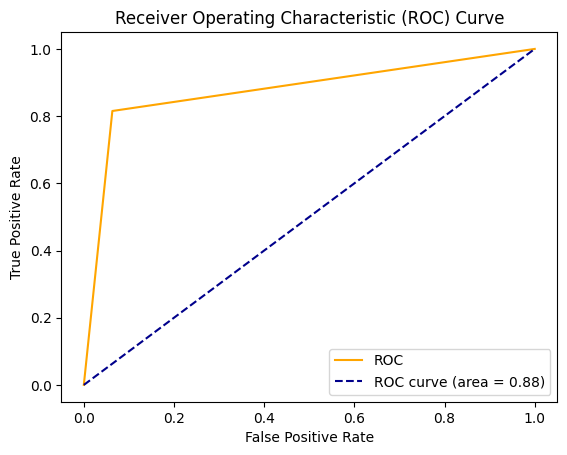

In [29]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

## Decision Tree

In [30]:
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train,y_train)

DecisionTreeClassifier()

In [31]:
import sklearn
import matplotlib.pyplot as plt 
from sklearn import tree 
%matplotlib inline

[Text(0.5, 0.75, 'X[12] <= 0.0\ngini = 0.462\nsamples = 8000\nvalue = [5100, 2900]'),
 Text(0.25, 0.25, 'gini = 0.0\nsamples = 2900\nvalue = [0, 2900]'),
 Text(0.75, 0.25, 'gini = 0.0\nsamples = 5100\nvalue = [5100, 0]')]

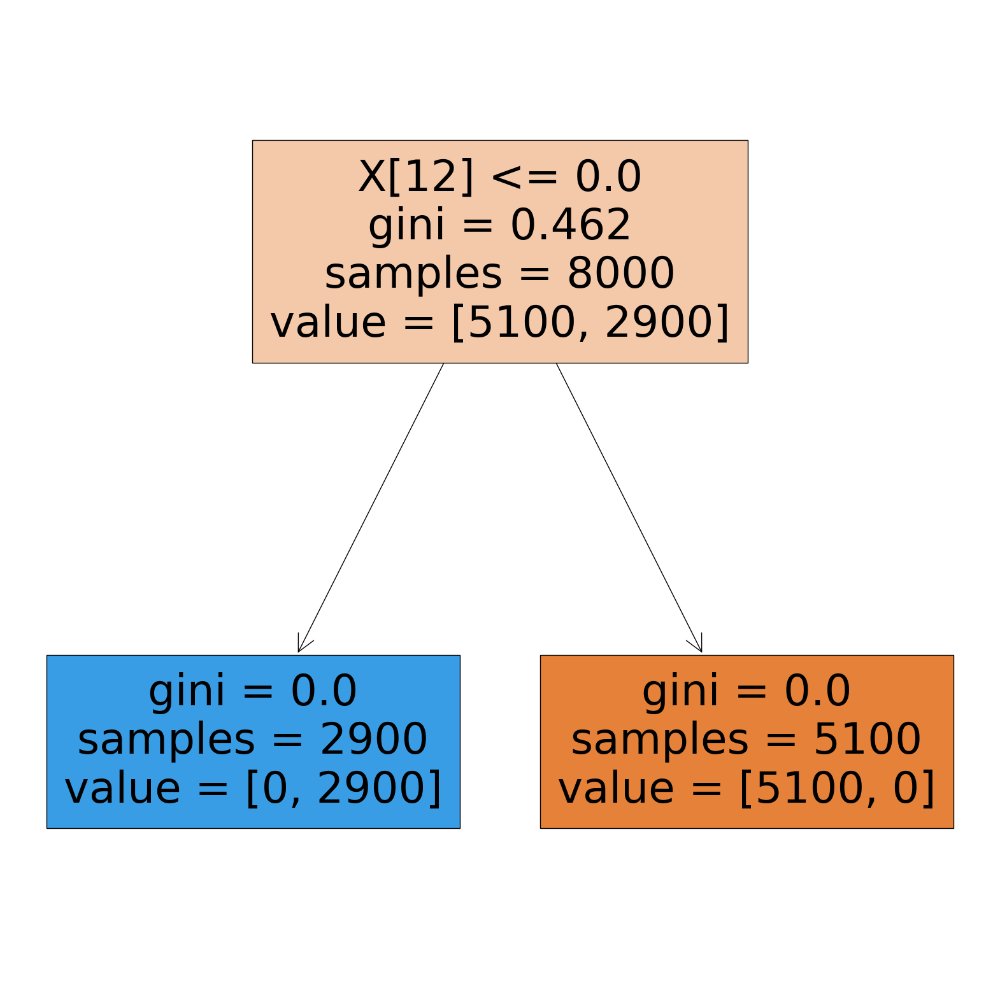

In [32]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [33]:
dt_model.predict(X)

array([0, 1, 0, ..., 1, 0, 0])

In [34]:
dt_model.score(X,Y)

0.9999

In [35]:
dt_model.score(X_test,y_test)

0.9995

In [36]:
dt_model.cost_complexity_pruning_path(X,Y)

{'ccp_alphas': array([0.      , 0.461912]),
 'impurities': array([0.      , 0.461912])}

In [37]:
path = dt_model.cost_complexity_pruning_path(X,Y)
ccp_alpha = path.ccp_alphas
ccp_alpha

array([0.      , 0.461912])

In [38]:
dt_model_ccp = DecisionTreeClassifier(random_state=0,ccp_alpha=0.14)
dt_model_ccp.fit(X,Y)

DecisionTreeClassifier(ccp_alpha=0.14, random_state=0)

[Text(0.5, 0.75, 'X[12] <= -0.0\ngini = 0.462\nsamples = 10000\nvalue = [6380, 3620]'),
 Text(0.25, 0.25, 'gini = 0.0\nsamples = 3620\nvalue = [0, 3620]'),
 Text(0.75, 0.25, 'gini = 0.0\nsamples = 6380\nvalue = [6380, 0]')]

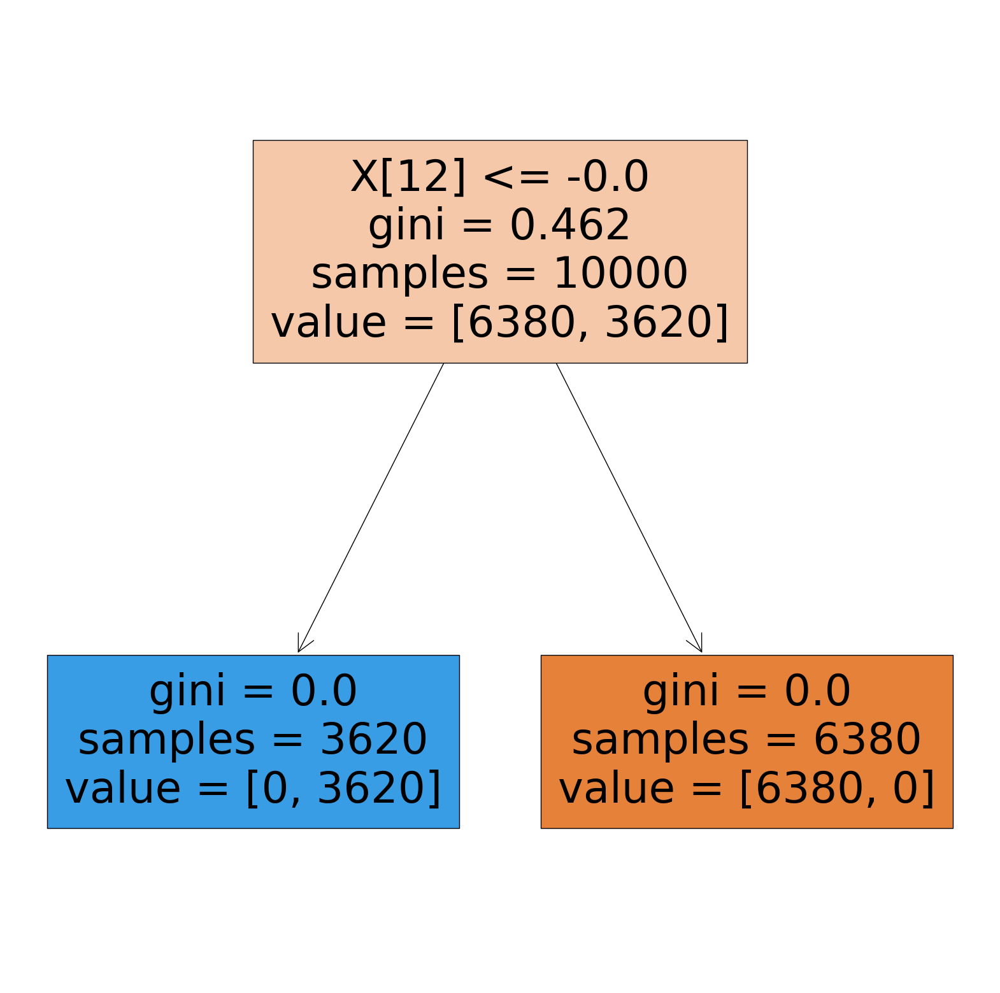

In [39]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [40]:
dt_model_ccp.score(X,Y)

1.0

In [41]:
dt_model_ccp.score(X_test,y_test)

1.0

In [42]:
rand_pram = {"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,40,1),
             "min_samples_split":range(2,10 ,1),
             "min_samples_leaf":range(1,10,1),
             'ccp_alpha':np.random.rand(20),
            }

In [43]:
rand_ccp = RandomizedSearchCV(estimator=dt_model_ccp,param_distributions=rand_pram , cv = 10 , n_jobs=-1)

In [44]:
rand_ccp.fit(X,Y)

RandomizedSearchCV(cv=10,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.14,
                                                    random_state=0),
                   n_jobs=-1,
                   param_distributions={'ccp_alpha': array([0.74060728, 0.36619356, 0.97357758, 0.25746603, 0.61541995,
       0.99537756, 0.23641403, 0.06731205, 0.7171872 , 0.86151435,
       0.32607516, 0.56706752, 0.64839985, 0.24359873, 0.60992816,
       0.45112908, 0.07302558, 0.70020318, 0.66804761, 0.44163069]),
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': range(2, 40),
                                        'min_samples_leaf': range(1, 10),
                                        'min_samples_split': range(2, 10),
                                        'splitter': ['best', 'random']})

In [45]:
rand_ccp.best_params_

{'splitter': 'best',
 'min_samples_split': 3,
 'min_samples_leaf': 5,
 'max_depth': 5,
 'criterion': 'entropy',
 'ccp_alpha': 0.668047608846057}

In [46]:
dt_cpp_new = DecisionTreeClassifier(criterion='entropy' , max_depth=3 ,min_samples_leaf= 4, min_samples_split=6 , splitter='best',ccp_alpha=0.085)

In [47]:
dt_cpp_new.fit(X,Y)

DecisionTreeClassifier(ccp_alpha=0.085, criterion='entropy', max_depth=3,
                       min_samples_leaf=4, min_samples_split=6)

In [48]:
dt_cpp_new.score(X,Y)

1.0

In [49]:
dt_cpp_new.score(X_test,y_test)

1.0

In [50]:
pred = dt_cpp_new.predict(X_train)

In [51]:
confusion_matrix(y_train,pred)

array([[5100,    0],
       [   0, 2900]], dtype=int64)

###  Bagging

In [52]:
from sklearn.ensemble import BaggingClassifier

In [53]:
bag_dt=BaggingClassifier(DecisionTreeClassifier(),n_estimators=10)

In [54]:
bag_dt.fit(X_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [55]:
bag_dt.predict(X_test)

array([0, 0, 0, ..., 0, 0, 0])

In [56]:
bag_dt.base_estimator

DecisionTreeClassifier()

In [57]:
bag_dt.classes_

array([0, 1])

In [58]:
bag_dt.score(X_test,y_test)

1.0

##  KNeighborsClassifie

In [59]:
from sklearn.neighbors import KNeighborsClassifier

In [60]:
bag_knc=BaggingClassifier(KNeighborsClassifier(6),n_estimators=100)

In [61]:
bag_knc.fit(X_train,y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6),
                  n_estimators=100)

In [62]:
bag_knc.predict(X_test)

array([0, 0, 0, ..., 0, 0, 0])

In [63]:
bag_knc.score(X_test,y_test)

0.7785

## RandomForest

In [64]:
from sklearn.ensemble import  RandomForestClassifier

In [65]:
rf = RandomForestClassifier(n_estimators=10)

In [66]:
rf.fit(X_train,y_train)

RandomForestClassifier(n_estimators=10)

In [67]:
rf.score(X_test,y_test)

0.9995

In [68]:
rf.estimators_

[DecisionTreeClassifier(max_features='sqrt', random_state=1593222508),
 DecisionTreeClassifier(max_features='sqrt', random_state=855798539),
 DecisionTreeClassifier(max_features='sqrt', random_state=1065632761),
 DecisionTreeClassifier(max_features='sqrt', random_state=894642193),
 DecisionTreeClassifier(max_features='sqrt', random_state=1402800377),
 DecisionTreeClassifier(max_features='sqrt', random_state=1206718819),
 DecisionTreeClassifier(max_features='sqrt', random_state=1877806517),
 DecisionTreeClassifier(max_features='sqrt', random_state=1746894435),
 DecisionTreeClassifier(max_features='sqrt', random_state=196437075),
 DecisionTreeClassifier(max_features='sqrt', random_state=1609176445)]

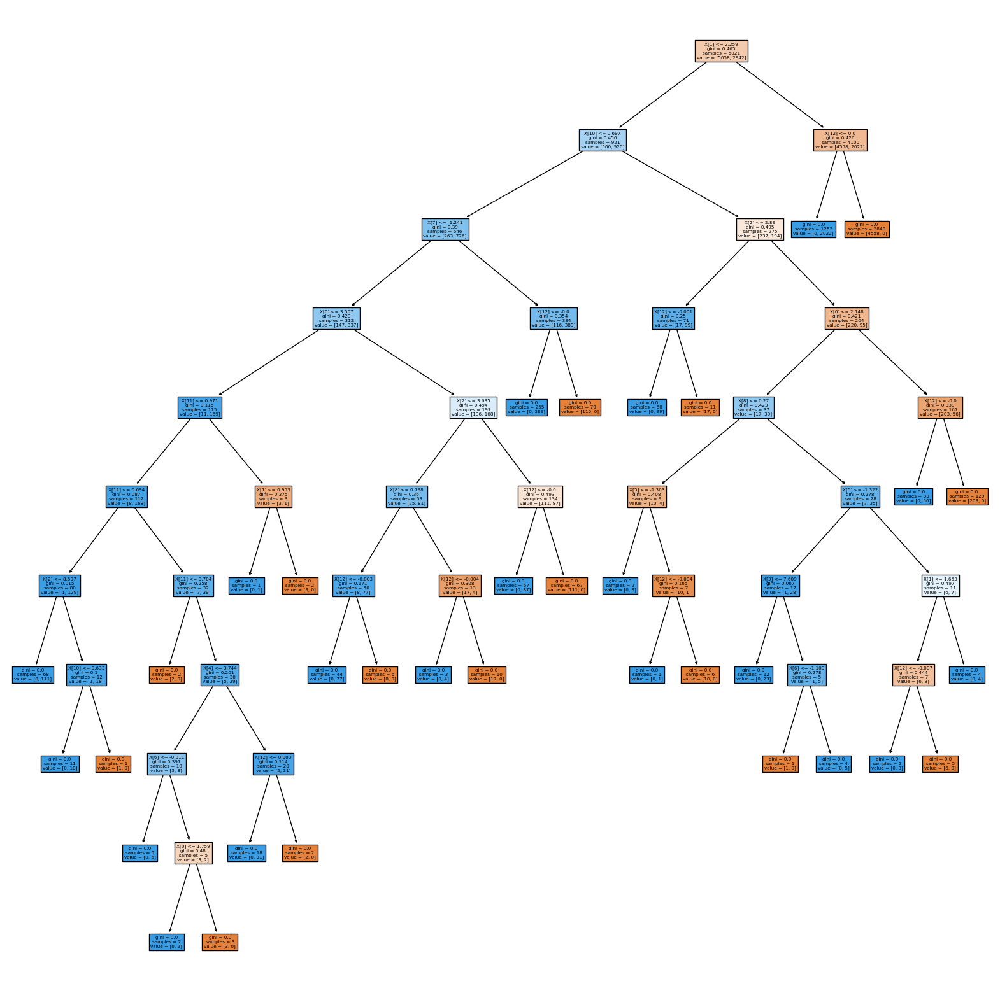

In [73]:
plt.figure(figsize=(20,20))
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i],filled=True)

In [69]:
rand_pram = {
            "n_estimators":[5,10,50,100,120,150],
            "criterion":['gini','entropy'],
            "max_depth" : range(2,40,1),
            "min_samples_split":range(2,10 ,1),
            "min_samples_leaf":range(1,10,1),
        }

In [71]:
rand_ccp = RandomizedSearchCV(estimator=rf,param_distributions=rand_pram , cv = 10 , n_jobs=-1)

In [72]:
rand_ccp.fit(X,Y)

RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=10),
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': range(2, 40),
                                        'min_samples_leaf': range(1, 10),
                                        'min_samples_split': range(2, 10),
                                        'n_estimators': [5, 10, 50, 100, 120,
                                                         150]})

In [74]:
rand_ccp.best_params_

{'n_estimators': 120,
 'min_samples_split': 7,
 'min_samples_leaf': 8,
 'max_depth': 8,
 'criterion': 'entropy'}

In [75]:
rf_new=RandomForestClassifier(criterion='entropy',max_depth=8,min_samples_leaf=8,min_samples_split=7,n_estimators=120)

In [76]:
rf_new.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=8, min_samples_leaf=8,
                       min_samples_split=7, n_estimators=120)

In [77]:
rf_new.predict(X_test)

array([0, 0, 0, ..., 0, 0, 0])

In [78]:
rf_new.score(X_test,y_test)

0.9995

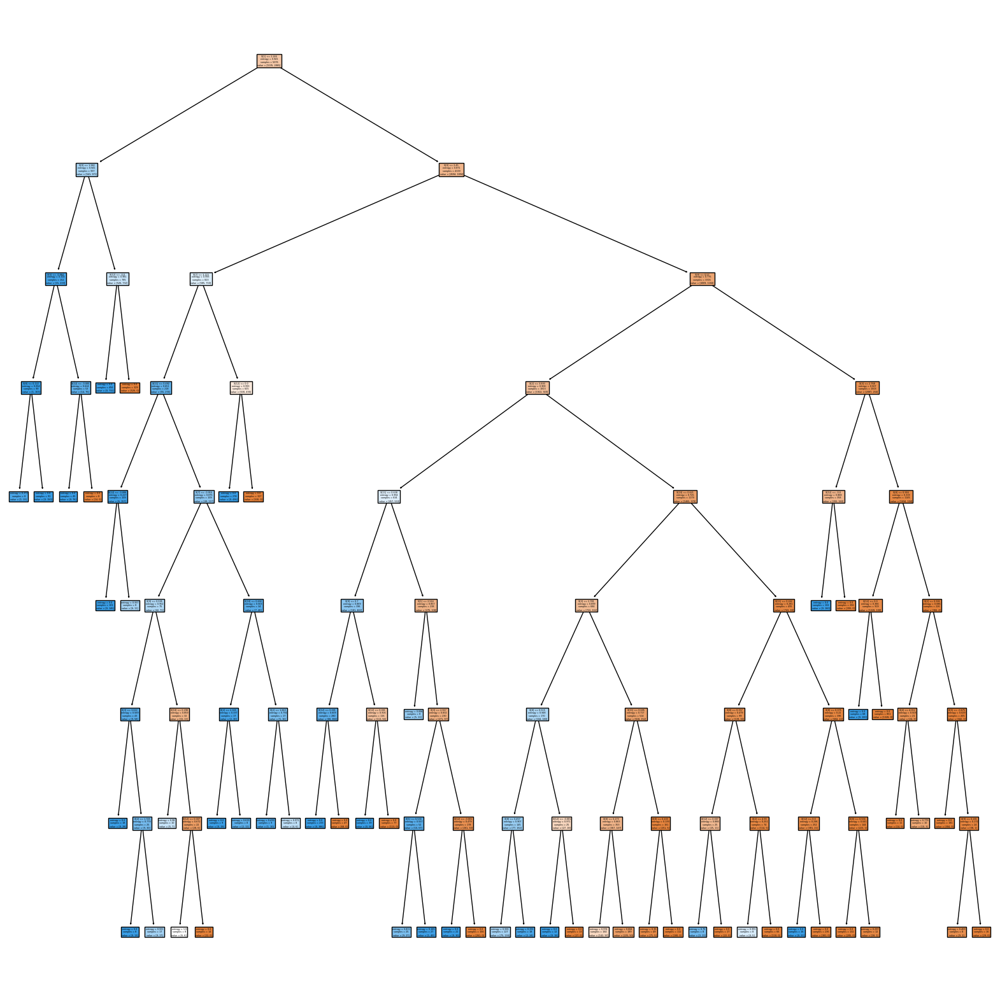

In [79]:
plt.figure(figsize=(20,20))
for i in range(len(rf_new.estimators_)):
    tree.plot_tree(rf_new.estimators_[i],filled=True)